# RL for the Travelling Salesman Problem
### Submitted by: Shivani Naik and Pulkit Saharan

Travelling Salesman Problem is one of the most conventional problems seen in the space of reinforcement learning. It is an optimization problem wherein we must find the shortest possible route to visit different places/cities. We need to determine the shortest path that visits each city precisely once, returns to the starting city, and is given a list of cities and the distances between each pair of cities. 

In this work, we have formulated the TSP as an RL (Reinforcement Learning) problem by identifying the states, actions, and rewards spaces. We have implemented Q-learning and SARSA algorithms based on these space definitions and trained these agents to solve the optimization problem and have conducted experiments to analyze the effect of hyperparameters of these algorithms. For additional constraints, we have introduced a traffic area constraint in the vanilla TSP. 

In [ ]:
!pip install -U kaleido
!pip install Ipython

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm import tqdm_notebook
import imageio
import io
from PIL import Image
import matplotlib.image as mpimg
from scipy.spatial.distance import cdist

#Class Definitions
## TSP Environment Class

This class implements the environment for running episodes of the Travelling Salesman Problem.

**State Space**: Number of cities to be visited (N)

**Action Space**:: Next City to visit from current city (N)

**Reward Functions**: Multiple options implemented. 

1. *Euclidean Distance:* Euclidean distance between city A and city B, reward will be negative of this distance
2. *Additional Reward:* Additional Reward will be negative of Euclidean distance between city A and city B times the intensity of the traffic in traffic zone 




In [ ]:
class TSPEnvironment(object):
    """Action space: Number of cities (Next city to visit)"""

    def __init__(self, n_cities = 10, max_box = 10, method = "distance", **kwargs):

        print(f"Envrionement with {n_cities} random cities")
        print(f"Reward function used is {method}")

        # Initialization
        self.n_cities = n_cities
        self.action_space = self.n_cities
        self.state_space = self.n_cities
        # Max distance for generating coordinates
        self.max_box = max_box
        # List of visited cities
        self.cities = []
        # Metric/Reward function to be used
        self.method = method

        # Generate stops
        self.traffic_constraint(**kwargs)
        self._create_cities()
        self._create_q_values()

        # display map of points
        self.render()

        # Initialize first point
        self.reset()


    def _create_cities(self):
        if self.method == "traffic_zone":
            #pass
            points = []
            while len(points) < self.n_cities:
                 x,y = np.random.rand(2)*self.max_box
                 if not self.points_in_traffic(x,y,self.t_zone):
                     points.append((x,y))

            xy = np.array(points)

        else:
            # Create random XY coordinates
            xy = np.random.rand(self.n_cities,2)*self.max_box

        # store X and Y coordinates of all cities separately
        self.x = xy[:,0]
        self.y = xy[:,1]


    def _create_q_values(self, zone_size = 0.2):

        # Q values as distance between points
        if self.method in ["distance","traffic_zone"]:
            xy = np.column_stack([self.x,self.y])
            self.q_cities = cdist(xy,xy)
        elif self.method=="time":
            pass
            # self.q_cities = np.random.rand(self.n_cities,self.n_cities)*self.max_box
            # np.fill_diagonal(self.q_cities,0)
        else:
            raise Exception("Method not recognized")

     #Defining traffic constraint based on the size of traffic area and intensity of the traffic
    def traffic_constraint(self,zone_size = 0.2,traffic_intensity = 10):

        if self.method == "traffic_zone":
            # Boundary points of traffic area 
            #Coordinates on x-axis
            x_left = np.random.rand() * (self.max_box) * (1-zone_size)
            x_right = x_left + np.random.rand() * zone_size * self.max_box
            #Coordinates on y-axis
            y_left = np.random.rand() * (self.max_box) * (1-zone_size)
            y_right = y_left + np.random.rand() * zone_size * self.max_box

            self.t_zone = (x_left,x_right,y_left,y_right)
            self.traffic_intensity = traffic_intensity 

    def points_in_traffic(self,x,y,t_zone):
        # Get traffic zone coordinates
        x_left,x_right,y_left,y_right = t_zone
        #Points will lie in the traffic area if the following condition be true
        return x >= x_left and x <= x_right and y >= y_left and y <= y_right
        
        #creating coordinates of traffic zone
    def zone_corners(self,x1,x2,y1,y2,x = None,y = None):

        # return y1 when y coordinates are same
        if y1 == y2:
            return y1
        # return x1 when x coordinates are same
        elif x1 == x2: 
            return x1
        # Calculate x and y 
        else:
            a = (y2-y1)/(x2-x1)
            b = y2 - a * x2

            if x is None:
                x = (y-b)/a
                return x
            elif y is None:
                y = a*x+b
                return y
            else:
                raise Exception("Need atleast one of x and y")


    def zone_crossing(self,x1,x2,y1,y2,t_zone):
        
        # traffic area intersection points
        crossing_points = []
        
        # Get box coordinates
        x_left,x_right,y_left,y_right = t_zone
     
        # Extracting the four corner coordinates using zone_corner 
        top_corner = self.zone_corners(x1,x2,y1,y2,y=y_right)
        bottom_corner = self.zone_corners(x1,x2,y1,y2,y=y_left)
        left_corner = self.zone_corners(x1,x2,y1,y2,x=x_left)
        right_corner = self.zone_corners(x1,x2,y1,y2,x=x_right)

         # Get the Top intersection of traffic zone with whole box
        if top_corner > x_left and top_corner < x_right:
            crossing_points.append((top_corner,y_right))

        # Get the Bottom intersection of traffic zone with whole box
        if bottom_corner > x_left and bottom_corner < x_right:
            crossing_points.append((bottom_corner,y_left))

        # Get the Left intersection of traffic zone with whole box
        if left_corner > y_left and left_corner < y_right:
            crossing_points.append((x_left,left_corner))

        # Get the Right intersection of traffic zone with whole box
        if right_corner > y_left and right_corner < y_right:
            crossing_points.append((x_right,right_corner))

        # returns the list of crossing coordinates
        return crossing_points


    def render(self, show_plot = True):
        """Visualize the environment state
        """

        fig = go.Figure()
        fig.update_layout(
            autosize=False,
            width=800,
            height=800,)

        index = np.arange(self.n_cities)
        # Show cities
        fig.add_trace(go.Scatter(x=self.x, y=self.y,
                    mode='markers+text',
                    name='markers',
                    marker=dict(size=8,
                                color='orange'),
                    text=index,
                    textposition="top center"))

        # # plot start city
        if len(self.cities)>0:
            xy = self._get_xy(initial = True)
            fig.add_annotation(x=xy[0], y=xy[1],
                      text="BEGIN",
                      showarrow=True,
                      arrowhead=1,
                      font=dict(
                      size=16))
        # Plot visited cities as a path
        if len(self.cities) > 1:
            # plot lines connecting list of visited cities

            fig.add_trace(go.Scatter(x=self.x[self.cities], y=self.y[self.cities],
                    mode='lines',
                    name='lines',
                    line=dict(color='purple',
                              dash='dash')))
            
            # Plot end of route
            # Get last visited city
            xy = self._get_xy(initial = False)
            fig.add_annotation(x=xy[0], y=xy[1],
                      text="END",
                      showarrow=True,
                      arrowhead=1,
                      font=dict(
                      size=16))
            
            #Check if problem have traffic constraint
        if hasattr(self,"t_zone"):
          # get the points of traffix box
            x_left,x_right,y_left,y_right = self.t_zone
            #add a rectangle shaped box to represent the traffic area
            fig.add_shape(type='rect',x0= x_left,y0= y_left, x1= x_right  , y1= y_right, line=dict(color="Blue"),fillcolor="SkyBlue",opacity=0.5)

        if show_plot:
          fig.show()
        else:
          image = fig.to_image(format="png")
          imageStream = io.BytesIO(image)
          image = Image.open(imageStream)
          return image
    
    def reset(self):
        """Restart the environment for experience replay
        Returns the first state
        """
        # Reset visited cities list
        self.cities = []

        # Random first city
        first_city = np.random.randint(self.n_cities)
        self.cities.append(first_city)

        return first_city

    def step(self,next_city, verbose=True):
        """Takes an action in a given state
        Returns:
            s_next: the next state
            reward: the reward for such action
            done: if the simulation is done
        """
        # Get current/last visited state
        state = self._get_last_state()
        s_next = next_city
        done=False

        # Get reward for going from current city to next city
        reward = self._get_reward(state, s_next)

        # Append next city to list of visited cities
        self.cities.append(next_city)
        # Done if all cities are visited
        done = (len(self.cities) == self.n_cities)

        if verbose:
            print("Current state: {}".format(state))
            print("Next visiting city {}".format(s_next))
            print("Reward: {}. Done: {}".format(reward, done))
            print("Visited cities list: {}".format(self.cities))
        
        return s_next, reward, done

    def _get_reward(self, state, s_next, cities_weight = 0.8):
        num_cities_visited = len(self.cities)
        distance_reward = self.q_cities[state, s_next]
        cities_visited_reward = cities_weight * num_cities_visited
        if self.method == "distance":
            return -1*distance_reward
        elif self.method == "time":
            pass
        elif self.method == "traffic_zone":
            
            # Extra reward in traffic zone
            xs,ys = self.x[state],self.y[state]
            xe,ye = self.x[s_next],self.y[s_next]
            crossing = self.zone_crossing(xs,xe,ys,ye,self.t_zone)
            # If there exist crossing with traffic area then given additional reward based on traffic intensity
            if len(crossing) > 0:
                i1,i2 = crossing
                traffic_distance = np.sqrt((i2[1]-i1[1])**2 + (i2[0]-i1[0])**2)
                traffic_reward = -1* traffic_distance * self.traffic_intensity * np.random.rand()
            else:
                traffic_reward = -1*np.random.rand()
            #Return reward based on distance and traffic
            return -1*distance_reward + traffic_reward

    def _get_last_state(self):
        return self.cities[-1]
    
    def _get_xy(self,initial = False):
        """Get coordinates of inital state or last visited state"""
        state = self.cities[0] if initial else self._get_last_state()
        x = self.x[state]
        y = self.y[state]
        return x,y



## Q-Learning Agent Class
This class implements the Q-learning agent which will be used to update Q-values and eventually get the optimal policy of visiting cities to maximize the reward.

In [ ]:
class QLAgent():
    def __init__(self,n_states,epsilon = 1.0,
    epsilon_min = 0.01,epsilon_decay = 0.999,gamma = 0.95,lr = 0.8):
        self.states_size = n_states
        self.actions_size = n_states
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.gamma = gamma
        self.lr = lr
        self.build_model(n_states, n_states)
        self.reset_memory()

    def build_model(self,states_size, actions_size):
        self.Q = np.zeros([states_size, actions_size])

    def update_q_values(self,s,a,r,s_next):

        # Update action value of current state s and action a based on Q-learning algorithm update
        self.Q[s,a] = self.Q[s,a] + self.lr * (r + self.gamma*np.max(self.Q[s_next,:]) - self.Q[s,a])

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
    
    def take_action(self,s):
        q = np.copy(self.Q[s,:])

        # Avoid already visited states
        q[self.states_memory] = -np.inf
        #Take greedy action if > epsilon else take exploratory action

        if np.random.rand() > self.epsilon:
            a = np.argmax(q)
        else:
            # random action from unvisited states only
            a = np.random.choice([x for x in range(self.actions_size) if x not in self.states_memory])

        return a
    
    def remember_state(self,s):
        self.states_memory.append(s)

    def reset_memory(self):
        self.states_memory = []

## SARSA Agent Class
This class implements the SARSA agent which will be used to update Q-values and eventually get the optimal policy of visiting cities to maximize the reward.

In [ ]:
class SARSA_Agent():
    def __init__(self,n_states,epsilon = 1.0,
    epsilon_min = 0.01,epsilon_decay = 0.999,gamma = 0.95,lr = 0.8):
        self.states_size = n_states
        self.actions_size = n_states
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.gamma = gamma
        self.lr = lr
        self.build_model(n_states, n_states)
        self.reset_memory()

    def build_model(self,states_size, actions_size):
        self.Q = np.zeros([states_size, actions_size])

    def update_q_values(self,s,a,r,s_next):
        # Take action in next state
        a_next = self.take_action(s_next)
       
        # Update action value of current state s and action a based on SARSA algorithm update
        self.Q[s,a] = self.Q[s,a] + self.lr * (r + self.gamma*self.Q[s_next,a_next] - self.Q[s,a])
        # decay epsilon if greater than minimum epsilon value
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
    
    def take_action(self,s):
        q = np.copy(self.Q[s,:])

        # Avoid already visited states
        q[self.states_memory] = -np.inf
        #Take greedy action if > epsilon else take exploratory action

        if np.random.rand() > self.epsilon:
            a = np.argmax(q)
        else:
            # random action from unvisited states only
            a = np.random.choice([x for x in range(self.actions_size) if x not in self.states_memory])

        return a
    
    def remember_state(self,s):
        self.states_memory.append(s)

    def reset_memory(self):
        self.states_memory = []

## Simulate one episode of TSP
Below run_episode function simulates one episode of TSP in given environment using given agent. run_multiple_episodes function will be used to train the agent.

In [ ]:
def run_episode(env, agent, verbose = True):
    if verbose:
      print("NEW EPISODE")
    # Reset environment and get start state
    start = env.reset()
    agent.reset_memory()
    max_steps = env.n_cities
    total_reward = 0
    #Set s as the start state
    s = start


    for i in range(0, max_steps):
        # Remember the states
        agent.remember_state(s)

        # Take an action using strategy
        a = agent.take_action(s)
        
        # Take the action, and get the reward from environment and done status
        s_next,r,done = env.step(a,verbose)
        
        if verbose:
          print(s_next,r,done)
        
        # Update Q values using agent
        agent.update_q_values(s,a,r,s_next)
        
        total_reward += r
        s = s_next
        
        # If the episode is terminated
        i += 1
        if done:
            break
            
    return env,agent,total_reward

def run_multiple_episodes(env, agent, n_episodes = 10, verbose=True, 
                          gif_name = 'tsp.gif', save_gif=True, plot=True):
    rewards = []
    plots = []

    for i in tqdm_notebook(range(n_episodes)):
        # Run one episode
        env, agent, total_reward = run_episode(env, agent, verbose = verbose)
        rewards.append(total_reward)
        if save_gif and i%10==0:
          img = env.render(show_plot=False)
          plots.append(img)
    # Save imgs as gif
    if save_gif:
      imageio.mimsave(gif_name,plots,fps = 10)

    # plot rewards over episodes
    if plot:
      fig = px.line(rewards, title="Rewards over episodes").update_layout(
                      yaxis={"title": "Rewards"}, xaxis={"title":"Episodes"})
      fig.show()

    return env, agent,rewards

In [ ]:
np.random.seed(10)

# Vanilla TSP

# Create Environment with 5 cities

In [ ]:
env = TSPEnvironment(n_cities = 5)

Envrionement with 5 random cities
Reward function used is distance


## Display environment with randomly visited start city

In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [3]


## Visit Randon Cities


In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 1
Step 0 , Visiting city 2:
Current state: 1
Next visiting city 2
Reward: -8.148732418458506. Done: False
Visited cities list: [1, 2]
Visited cities list: [1, 2]
Reward: -8.148732418458506. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -1.4653099293560534. Done: False
Visited cities list: [1, 2, 4]
Visited cities list: [1, 2, 4]
Reward: -1.4653099293560534. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -1.4653099293560534. Done: False
Visited cities list: [1, 2, 4, 2]
Visited cities list: [1, 2, 4, 2]
Reward: -1.4653099293560534. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -3.3327614216957127. Done: True
Visited cities list: [1, 2, 4, 2, 3]
Visited cities list: [1, 2, 4, 2, 3]
Reward: -3.3327614216957127. Done: True


## Create Q-Learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run One Episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 4
Next visiting city 2
Reward: -1.4653099293560534. Done: False
Visited cities list: [4, 2]
2 -1.4653099293560534 False
Current state: 2
Next visiting city 1
Reward: -8.148732418458506. Done: False
Visited cities list: [4, 2, 1]
1 -8.148732418458506 False
Current state: 1
Next visiting city 0
Reward: -8.117758919340837. Done: False
Visited cities list: [4, 2, 1, 0]
0 -8.117758919340837 False
Current state: 0
Next visiting city 3
Reward: -6.6251772917922835. Done: True
Visited cities list: [4, 2, 1, 0, 3]
3 -6.6251772917922835 True
Total reward: -24.35697855894768


## Train Agent

In [ ]:
gif_name = "tsp_V_Q_5.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-5-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render Final Optimal Route

In [ ]:
env.render()

## Create SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run Episodes

In [ ]:
gif_name = "tsp_V_S_5.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render Final Optimal Route

In [ ]:
env.render()

#Create Environment with 50 cities

In [ ]:
env = TSPEnvironment(n_cities = 50)

Envrionement with 50 random cities
Reward function used is distance


### Display environment with randomly visited start city


In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [18]


## Visit Random Cities

In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 3
Step 0 , Visiting city 2:
Current state: 3
Next visiting city 2
Reward: -1.5494155312327798. Done: False
Visited cities list: [3, 2]
Visited cities list: [3, 2]
Reward: -1.5494155312327798. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -3.197184040419098. Done: False
Visited cities list: [3, 2, 4]
Visited cities list: [3, 2, 4]
Reward: -3.197184040419098. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -3.197184040419098. Done: False
Visited cities list: [3, 2, 4, 2]
Visited cities list: [3, 2, 4, 2]
Reward: -3.197184040419098. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -1.5494155312327798. Done: False
Visited cities list: [3, 2, 4, 2, 3]
Visited cities list: [3, 2, 4, 2, 3]
Reward: -1.5494155312327798. Done: False


## Create Q-learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run one episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 41
Next visiting city 34
Reward: -5.736733159560989. Done: False
Visited cities list: [41, 34]
34 -5.736733159560989 False
Current state: 34
Next visiting city 22
Reward: -7.528518589865881. Done: False
Visited cities list: [41, 34, 22]
22 -7.528518589865881 False
Current state: 22
Next visiting city 0
Reward: -5.566238397225928. Done: False
Visited cities list: [41, 34, 22, 0]
0 -5.566238397225928 False
Current state: 0
Next visiting city 46
Reward: -2.4610504242898195. Done: False
Visited cities list: [41, 34, 22, 0, 46]
46 -2.4610504242898195 False
Current state: 46
Next visiting city 44
Reward: -5.328407652262536. Done: False
Visited cities list: [41, 34, 22, 0, 46, 44]
44 -5.328407652262536 False
Current state: 44
Next visiting city 21
Reward: -4.4734577713229795. Done: False
Visited cities list: [41, 34, 22, 0, 46, 44, 21]
21 -4.4734577713229795 False
Current state: 21
Next visiting city 5
Reward: -6.528595799401978. Done: False
Visited cities list: [41

In [ ]:
gif_name = "tsp_V_Q_50.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render final optimal route

In [ ]:
env.render()

## SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run episodes

In [ ]:
gif_name = "tsp_V_S_50.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render optimal route

In [ ]:
env.render()

#Create Environment with 100 cities

In [ ]:
env = TSPEnvironment(n_cities = 100)

Envrionement with 100 random cities
Reward function used is distance


### Display environment with randomly visited start city


In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [23]


## Visit Random Cities

In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 99
Step 0 , Visiting city 2:
Current state: 99
Next visiting city 2
Reward: -6.5818262436273285. Done: False
Visited cities list: [99, 2]
Visited cities list: [99, 2]
Reward: -6.5818262436273285. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -0.203443550956539. Done: False
Visited cities list: [99, 2, 4]
Visited cities list: [99, 2, 4]
Reward: -0.203443550956539. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -0.203443550956539. Done: False
Visited cities list: [99, 2, 4, 2]
Visited cities list: [99, 2, 4, 2]
Reward: -0.203443550956539. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -2.8489377699815353. Done: False
Visited cities list: [99, 2, 4, 2, 3]
Visited cities list: [99, 2, 4, 2, 3]
Reward: -2.8489377699815353. Done: False


## Create Q-learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run one episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 7
Next visiting city 87
Reward: -6.324253164977611. Done: False
Visited cities list: [7, 87]
87 -6.324253164977611 False
Current state: 87
Next visiting city 28
Reward: -10.406131528662343. Done: False
Visited cities list: [7, 87, 28]
28 -10.406131528662343 False
Current state: 28
Next visiting city 40
Reward: -5.173079752376036. Done: False
Visited cities list: [7, 87, 28, 40]
40 -5.173079752376036 False
Current state: 40
Next visiting city 30
Reward: -4.628737360222062. Done: False
Visited cities list: [7, 87, 28, 40, 30]
30 -4.628737360222062 False
Current state: 30
Next visiting city 23
Reward: -7.627872130254119. Done: False
Visited cities list: [7, 87, 28, 40, 30, 23]
23 -7.627872130254119 False
Current state: 23
Next visiting city 66
Reward: -3.703707710459396. Done: False
Visited cities list: [7, 87, 28, 40, 30, 23, 66]
66 -3.703707710459396 False
Current state: 66
Next visiting city 4
Reward: -3.081383191647548. Done: False
Visited cities list: [7, 8

In [ ]:
gif_name = "tsp_V_Q_100.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render final optimal route

In [ ]:
env.render()

## SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run episodes

In [ ]:
gif_name = "tsp_V_S_100.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render optimal route

In [ ]:
env.render()

#Create Environment with 500 cities

In [ ]:
env = TSPEnvironment(n_cities = 500)

Envrionement with 500 random cities
Reward function used is distance


### Display environment with randomly visited start city


In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [185]


## Visit Random Cities

In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 332
Step 0 , Visiting city 2:
Current state: 332
Next visiting city 2
Reward: -4.494727505336386. Done: False
Visited cities list: [332, 2]
Visited cities list: [332, 2]
Reward: -4.494727505336386. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -4.107611766162687. Done: False
Visited cities list: [332, 2, 4]
Visited cities list: [332, 2, 4]
Reward: -4.107611766162687. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -4.107611766162687. Done: False
Visited cities list: [332, 2, 4, 2]
Visited cities list: [332, 2, 4, 2]
Reward: -4.107611766162687. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -8.621978622171339. Done: False
Visited cities list: [332, 2, 4, 2, 3]
Visited cities list: [332, 2, 4, 2, 3]
Reward: -8.621978622171339. Done: False


## Create Q-learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run one episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 102
Next visiting city 161
Reward: -2.496887316246738. Done: False
Visited cities list: [102, 161]
161 -2.496887316246738 False
Current state: 161
Next visiting city 92
Reward: -3.850907419430978. Done: False
Visited cities list: [102, 161, 92]
92 -3.850907419430978 False
Current state: 92
Next visiting city 487
Reward: -0.8580858754009344. Done: False
Visited cities list: [102, 161, 92, 487]
487 -0.8580858754009344 False
Current state: 487
Next visiting city 427
Reward: -1.3400108052139856. Done: False
Visited cities list: [102, 161, 92, 487, 427]
427 -1.3400108052139856 False
Current state: 427
Next visiting city 247
Reward: -3.400795671582389. Done: False
Visited cities list: [102, 161, 92, 487, 427, 247]
247 -3.400795671582389 False
Current state: 247
Next visiting city 412
Reward: -6.577594248396823. Done: False
Visited cities list: [102, 161, 92, 487, 427, 247, 412]
412 -6.577594248396823 False
Current state: 412
Next visiting city 210
Reward: -4.787939

In [ ]:
gif_name = "tsp_V_Q_500.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render final optimal route

In [ ]:
env.render()

## SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run episodes

In [ ]:
gif_name = "tsp_V_S_500.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render optimal route

In [ ]:
env.render()

#Experiments with different hyperparameters (Q-Learning)


### Learning Rate

In [ ]:
lrs = [0.01,0.5,0.8]
lr_rewards = dict()
runs = 100
n_episodes = 500
rewards = np.zeros((runs, n_episodes))
for lr in lrs:
  for run in tqdm_notebook(range(runs)):
        env.reset()
        agent = QLAgent(env.state_space, lr = lr)
        env, agent, rewards[run][:], = run_multiple_episodes(env, agent, n_episodes=n_episodes, verbose=False,
                                   save_gif=False, plot=False)
  rewards_avg = np.average(rewards, axis = 0)
  lr_rewards[lr]=rewards_avg

<ipython-input-114-7a1fb96c410d>:7: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

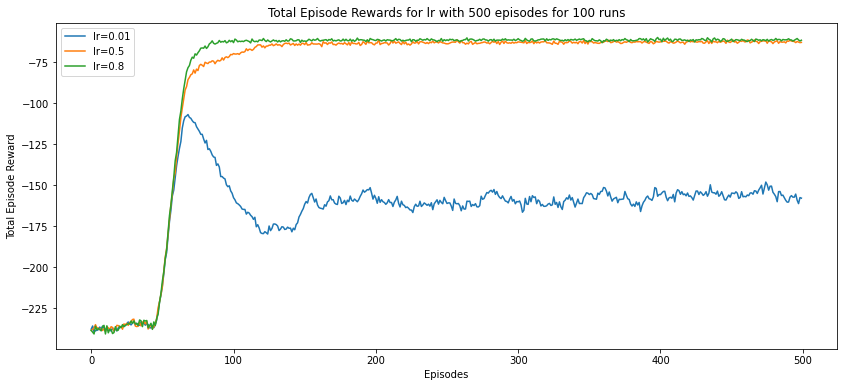

In [ ]:
f, ax = plt.subplots(figsize=(14, 6))
for lr in lrs:
    ax.plot(range(n_episodes), lr_rewards[lr], label='lr={}'.format(lr))
ax.legend()
plt.title('Total Episode Rewards for lr with {}'.format(n_episodes) + ' episodes for {} runs'.format(runs))
plt.xlabel('Episodes')
plt.ylabel('Total Episode Reward');

### Epsilon

In [ ]:
Epsilons = [0.1,0.5, 1.0]
e_rewards = dict()
runs = 100
n_episodes = 500
epsilon_decay = 1.0
#epsilon_decay = 0.999
rewards = np.zeros((runs, n_episodes))
for epsilon in Epsilons:
  for run in tqdm_notebook(range(runs)):
        env.reset()
        agent = QLAgent(env.state_space, epsilon=epsilon, epsilon_decay = epsilon_decay)
        env, agent, rewards[run][:], = run_multiple_episodes(env, agent, n_episodes=n_episodes, verbose=False,
                                   save_gif=False, plot=False)
  rewards_avg = np.average(rewards, axis = 0)
  e_rewards[epsilon]=rewards_avg

<ipython-input-121-1a753389ec56>:9: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

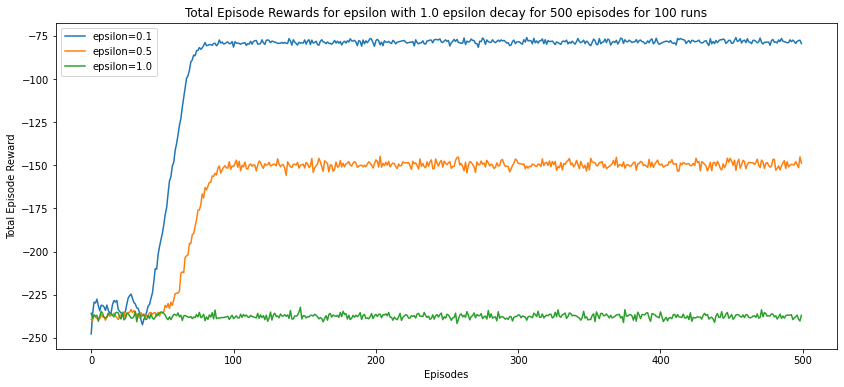

In [ ]:
f, ax = plt.subplots(figsize=(14, 6))
for epsilon in Epsilons:
    ax.plot(range(n_episodes), e_rewards[epsilon], label='epsilon={}'.format(epsilon))
ax.legend()
plt.title('Total Episode Rewards for epsilon with {} epsilon decay for {}'.format(epsilon_decay, n_episodes) + ' episodes for {} runs'.format(runs))
plt.xlabel('Episodes')
plt.ylabel('Total Episode Reward');

### Gamma

In [ ]:
gammas = [0.01,0.5,0.95]
gamma_rewards = dict()
n_episodes = 500
runs = 100
for gamma in gammas:
  for run in tqdm_notebook(range(runs)):
        env.reset()
        agent = QLAgent(env.state_space, gamma = gamma)
        env, agent, rewards[run][:], = run_multiple_episodes(env, agent, n_episodes=n_episodes, verbose=False,
                                   save_gif=False, plot=False)
  rewards_avg = np.average(rewards, axis = 0)
  gamma_rewards[gamma]=rewards_avg

<ipython-input-119-62b5ab671c6f>:6: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

Text(0, 0.5, 'Total Episode Reward')

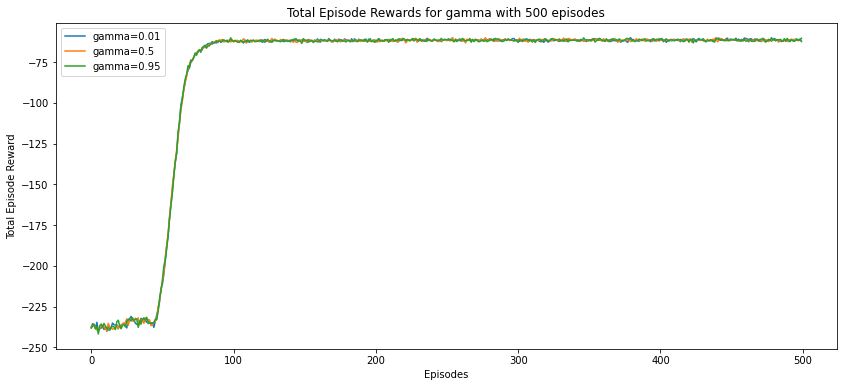

In [ ]:
f, ax = plt.subplots(figsize=(14, 6))
for gamma in gammas:
    ax.plot(range(n_episodes), gamma_rewards[gamma], label='gamma={}'.format(gamma))
ax.legend()
plt.title('Total Episode Rewards for gamma with {}'.format(n_episodes) + ' episodes')
plt.xlabel('Episodes')
plt.ylabel('Total Episode Reward')
# ax.set_ylim(0,1) #Max for 100%

## Q-Learning vs SARSA

In [ ]:
agent_rewards = dict()
runs = 100
n_episodes = 500
rewards = np.zeros((runs, n_episodes))
for run in tqdm_notebook(range(runs)):
      env.reset()
      agent = QLAgent(env.state_space, env.action_space)
      env, agent, rewards[run][:], = run_multiple_episodes(env, agent, n_episodes=n_episodes, verbose=False,
                                  save_gif=False, plot=False)
rewards_avg = np.average(rewards, axis = 0)
agent_rewards['Q-Learning']=rewards_avg

<ipython-input-141-862e8239b9d1>:5: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-127-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
agent_rewards

In [ ]:
rewards = np.zeros((runs, n_episodes))
for run in tqdm_notebook(range(runs)):
      env.reset()
      agent = SARSA_Agent(env.state_space, env.action_space)
      env, agent, rewards[run][:], = run_multiple_episodes(env, agent, n_episodes=n_episodes, verbose=False,
                                  save_gif=False, plot=False)
rewards_avg = np.average(rewards, axis = 0)
agent_rewards['SARSA']=rewards_avg

<ipython-input-142-193f64e982f3>:2: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-127-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

Text(0, 0.5, 'Total Episode Reward')

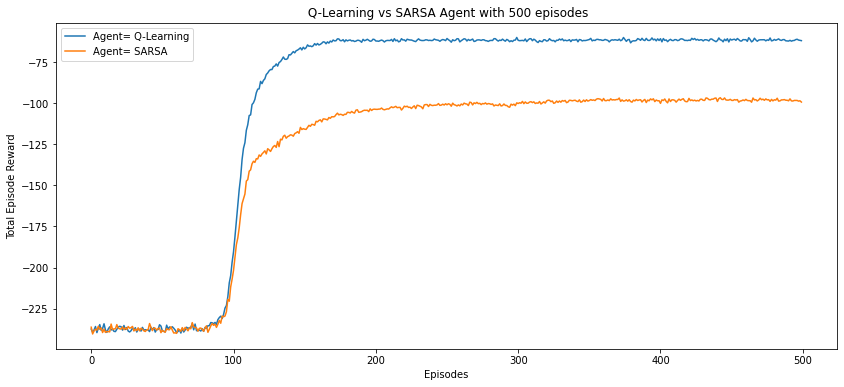

In [ ]:
f, ax = plt.subplots(figsize=(14, 6))
for a in ['Q-Learning','SARSA']:
    ax.plot(range(n_episodes), agent_rewards[a], label='Agent= {}'.format(a))
ax.legend()
plt.title(' Q-Learning vs SARSA Agent with {}'.format(n_episodes) + ' episodes' )
plt.xlabel('Episodes')
plt.ylabel('Total Episode Reward')

# TSP with Traffic Constraint


# Create Environment with 5 cities

In [ ]:
env = TSPEnvironment(n_cities = 5, method='traffic_zone',zone_size = 0.4,traffic_intensity = 20)

Envrionement with 5 random cities
Reward function used is traffic_zone


## Display environment with randomly visited start city

In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [2]


## Visit Randon Cities


In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 4
Step 0 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -9.669563753100968. Done: False
Visited cities list: [4, 2]
Visited cities list: [4, 2]
Reward: -9.669563753100968. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -9.311140403860714. Done: False
Visited cities list: [4, 2, 4]
Visited cities list: [4, 2, 4]
Reward: -9.311140403860714. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -9.60118612171731. Done: False
Visited cities list: [4, 2, 4, 2]
Visited cities list: [4, 2, 4, 2]
Reward: -9.60118612171731. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -3.645285396004157. Done: True
Visited cities list: [4, 2, 4, 2, 3]
Visited cities list: [4, 2, 4, 2, 3]
Reward: -3.645285396004157. Done: True


## Create Q-Learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run One Episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 3
Next visiting city 4
Reward: -16.539510220437375. Done: False
Visited cities list: [3, 4]
4 -16.539510220437375 False
Current state: 4
Next visiting city 2
Reward: -9.432520832374694. Done: False
Visited cities list: [3, 4, 2]
2 -9.432520832374694 False
Current state: 2
Next visiting city 1
Reward: -8.37391491211655. Done: False
Visited cities list: [3, 4, 2, 1]
1 -8.37391491211655 False
Current state: 1
Next visiting city 0
Reward: -1.1770707164708616. Done: True
Visited cities list: [3, 4, 2, 1, 0]
0 -1.1770707164708616 True
Total reward: -35.523016681399476


In [ ]:
gif_name = "tsp_T_Q_5.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render Final Optimal Route

In [ ]:
env.render()

## Create SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run Episodes

In [ ]:
gif_name = "tsp_T_S_5.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render Final Optimal Route

In [ ]:
env.render()

#Create Environment with 50 cities

In [ ]:
env = TSPEnvironment(n_cities = 50, method='traffic_zone',zone_size = 0.4,traffic_intensity = 20)

Envrionement with 50 random cities
Reward function used is traffic_zone


### Display environment with randomly visited start city


In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [28]


## Visit Random Cities

In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 28
Step 0 , Visiting city 2:
Current state: 28
Next visiting city 2
Reward: -9.454509772246245. Done: False
Visited cities list: [28, 2]
Visited cities list: [28, 2]
Reward: -9.454509772246245. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -3.447187210544293. Done: False
Visited cities list: [28, 2, 4]
Visited cities list: [28, 2, 4]
Reward: -3.447187210544293. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -3.9174873894214635. Done: False
Visited cities list: [28, 2, 4, 2]
Visited cities list: [28, 2, 4, 2]
Reward: -3.9174873894214635. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -1.2020138187255074. Done: False
Visited cities list: [28, 2, 4, 2, 3]
Visited cities list: [28, 2, 4, 2, 3]
Reward: -1.2020138187255074. Done: False


## Create Q-learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run one episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 22
Next visiting city 49
Reward: -34.784096468916076. Done: False
Visited cities list: [22, 49]
49 -34.784096468916076 False
Current state: 49
Next visiting city 33
Reward: -10.262269672927431. Done: False
Visited cities list: [22, 49, 33]
33 -10.262269672927431 False
Current state: 33
Next visiting city 41
Reward: -9.097455337564568. Done: False
Visited cities list: [22, 49, 33, 41]
41 -9.097455337564568 False
Current state: 41
Next visiting city 5
Reward: -2.2964295759961972. Done: False
Visited cities list: [22, 49, 33, 41, 5]
5 -2.2964295759961972 False
Current state: 5
Next visiting city 16
Reward: -40.645679855814514. Done: False
Visited cities list: [22, 49, 33, 41, 5, 16]
16 -40.645679855814514 False
Current state: 16
Next visiting city 19
Reward: -29.63534363903089. Done: False
Visited cities list: [22, 49, 33, 41, 5, 16, 19]
19 -29.63534363903089 False
Current state: 19
Next visiting city 45
Reward: -4.344242556727072. Done: False
Visited cities lis

In [ ]:
gif_name = "tsp_T_Q_50.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render final optimal route

In [ ]:
env.render()

## SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run episodes

In [ ]:
gif_name = "tsp_T_S_50.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render optimal route

In [ ]:
env.render()

#Create Environment with 100 cities

In [ ]:
env = TSPEnvironment(n_cities = 100, method='traffic_zone',zone_size = 0.4,traffic_intensity = 20)

Envrionement with 100 random cities
Reward function used is traffic_zone


### Display environment with randomly visited start city


In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [40]


## Visit Random Cities

In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 53
Step 0 , Visiting city 2:
Current state: 53
Next visiting city 2
Reward: -32.19758407535632. Done: False
Visited cities list: [53, 2]
Visited cities list: [53, 2]
Reward: -32.19758407535632. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -6.078248361711557. Done: False
Visited cities list: [53, 2, 4]
Visited cities list: [53, 2, 4]
Reward: -6.078248361711557. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -6.041814737486897. Done: False
Visited cities list: [53, 2, 4, 2]
Visited cities list: [53, 2, 4, 2]
Reward: -6.041814737486897. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -17.72779027982343. Done: False
Visited cities list: [53, 2, 4, 2, 3]
Visited cities list: [53, 2, 4, 2, 3]
Reward: -17.72779027982343. Done: False


## Create Q-learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run one episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 95
Next visiting city 14
Reward: -5.13716402339926. Done: False
Visited cities list: [95, 14]
14 -5.13716402339926 False
Current state: 14
Next visiting city 56
Reward: -7.737542338661864. Done: False
Visited cities list: [95, 14, 56]
56 -7.737542338661864 False
Current state: 56
Next visiting city 1
Reward: -7.813186928990762. Done: False
Visited cities list: [95, 14, 56, 1]
1 -7.813186928990762 False
Current state: 1
Next visiting city 8
Reward: -7.33489425077346. Done: False
Visited cities list: [95, 14, 56, 1, 8]
8 -7.33489425077346 False
Current state: 8
Next visiting city 97
Reward: -8.88621456489705. Done: False
Visited cities list: [95, 14, 56, 1, 8, 97]
97 -8.88621456489705 False
Current state: 97
Next visiting city 61
Reward: -9.690385790273695. Done: False
Visited cities list: [95, 14, 56, 1, 8, 97, 61]
61 -9.690385790273695 False
Current state: 61
Next visiting city 4
Reward: -16.82259017712508. Done: False
Visited cities list: [95, 14, 56, 1, 8, 

In [ ]:
gif_name = "tsp_T_Q_100.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render final optimal route

In [ ]:
env.render()

## SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run episodes

In [ ]:
gif_name = "tsp_T_S_100.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render optimal route

In [ ]:
env.render()

#Create Environment with 500 cities

In [ ]:
env = TSPEnvironment(n_cities = 500, method='traffic_zone',zone_size = 0.4,traffic_intensity = 20)

Envrionement with 500 random cities
Reward function used is traffic_zone


### Display environment with randomly visited start city


In [ ]:
img = env.render()
print("Visited cities: ",env.cities)

Visited cities:  [430]


## Visit Random Cities

In [ ]:
env.reset()
print("Start state:", env.cities[0])
for i,city_visited in enumerate([2,4,2,3]):
  print("Step {} , Visiting city {}:".format(i, city_visited) )
  s_next, reward, done = env.step(city_visited)
  print("Visited cities list: {}".format(env.cities))
  print("Reward: {}. Done: {}".format(reward, done))
env.render()

Start state: 315
Step 0 , Visiting city 2:
Current state: 315
Next visiting city 2
Reward: -51.580294684219616. Done: False
Visited cities list: [315, 2]
Visited cities list: [315, 2]
Reward: -51.580294684219616. Done: False
Step 1 , Visiting city 4:
Current state: 2
Next visiting city 4
Reward: -9.022353006029043. Done: False
Visited cities list: [315, 2, 4]
Visited cities list: [315, 2, 4]
Reward: -9.022353006029043. Done: False
Step 2 , Visiting city 2:
Current state: 4
Next visiting city 2
Reward: -8.312466552543407. Done: False
Visited cities list: [315, 2, 4, 2]
Visited cities list: [315, 2, 4, 2]
Reward: -8.312466552543407. Done: False
Step 3 , Visiting city 3:
Current state: 2
Next visiting city 3
Reward: -7.039542714613211. Done: False
Visited cities list: [315, 2, 4, 2, 3]
Visited cities list: [315, 2, 4, 2, 3]
Reward: -7.039542714613211. Done: False


## Create Q-learning agent

In [ ]:
agent = QLAgent(env.state_space, env.action_space)

## Run one episode

In [ ]:
env, agent, total_reward = run_episode(env, agent, verbose=True)
print('Total reward:',total_reward)

NEW EPISODE
Current state: 404
Next visiting city 19
Reward: -6.751354102512593. Done: False
Visited cities list: [404, 19]
19 -6.751354102512593 False
Current state: 19
Next visiting city 106
Reward: -2.9221022821095217. Done: False
Visited cities list: [404, 19, 106]
106 -2.9221022821095217 False
Current state: 106
Next visiting city 391
Reward: -3.8694966304436385. Done: False
Visited cities list: [404, 19, 106, 391]
391 -3.8694966304436385 False
Current state: 391
Next visiting city 319
Reward: -3.782665390107571. Done: False
Visited cities list: [404, 19, 106, 391, 319]
319 -3.782665390107571 False
Current state: 319
Next visiting city 140
Reward: -9.815607373549087. Done: False
Visited cities list: [404, 19, 106, 391, 319, 140]
140 -9.815607373549087 False
Current state: 140
Next visiting city 498
Reward: -5.513900997369617. Done: False
Visited cities list: [404, 19, 106, 391, 319, 140, 498]
498 -5.513900997369617 False
Current state: 498
Next visiting city 90
Reward: -2.73150922

In [ ]:
gif_name = "tsp_T_Q_500.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=1000, verbose=False,
                                   gif_name = gif_name)

<ipython-input-5-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/1000 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

## Render final optimal route

In [ ]:
env.render()

## SARSA Agent

In [ ]:
agent = SARSA_Agent(env.state_space)

## Run episodes

In [ ]:
gif_name = "tsp_T_S_500.gif"
env, agent, rewards = run_multiple_episodes(env, agent, n_episodes=500, verbose=False,
                                   gif_name = gif_name)

<ipython-input-20-b2c9399fbcd9>:44: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/500 [00:00<?, ?it/s]

## Render optimal route

In [ ]:
env.render()